In [21]:
import pandas as pd 
import re

import geopandas as gpd 
from shapely.geometry import Point
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

import folium
from folium import Polygon
from folium import Choropleth
from folium import Circle, PolyLine

from shapely import wkt


# Configure Notebook
import warnings
warnings.filterwarnings('ignore')
%config Completer.use_jedi = False

In [35]:
house_prices_gpd = pd.read_csv('final_house_data.csv')

house_prices_gpd['geometry'] = house_prices_gpd['geometry'].apply(wkt.loads)

house_prices_gpd = gpd.GeoDataFrame(house_prices_gpd, crs='epsg:4326')

In [36]:
neighbourhoods = gpd.read_file('toronto_neighbourhoods.shp')
pattern= r'(\D+)[^()\d]'
neighbourhoods['FIELD_8']=neighbourhoods.apply(lambda row:[matches for matches in re.findall(pattern,row['FIELD_8'])][0],axis=1)
neighbourhoods=neighbourhoods[['geometry','FIELD_8']].rename(columns={'FIELD_8':'neighbourhood'})
neighbourhoods['area'] = neighbourhoods['geometry']
neighbourhoods.to_crs(epsg='4326',inplace=True)

house_prices_gpd = house_prices_gpd.sjoin(neighbourhoods, how = "left")
house_prices_gpd.head()

,Unnamed: 0,address,Date,geometry,Price,propertyLng,propertyLat,T_Detached,T_Semi-Detached,T_other,...,Pool,Waterfront,Furnished,Size,Front_E,Front_S,Front_W,index_right,neighbourhood,area
0,0,82-riverdale-drive,2013-11-29,POINT (-79.56070 43.73370),1100000.0,-79.5607,43.7337,1,0,0,...,1,0.0,0.0,170.00,0,0,1,56.0,Thistletown-Beaumond Heights,"POLYGON ((-79.57751 43.73384, -79.57806 43.734..."
1,1,9-silver-spruce-drive,2009-09-30,POINT (-79.32360 43.80010),528800.0,-79.3236,43.8001,1,0,0,...,0,0.0,0.0,160.63,1,0,0,139.0,L'Amoreaux,"POLYGON ((-79.28857 43.79607, -79.28921 43.795..."
2,3,185-honiton-street,2014-09-19,POINT (-79.46110 43.76160),1008888.0,-79.4611,43.7616,1,0,0,...,1,0.0,0.0,158.95,1,0,0,79.0,Bathurst Manor,"POLYGON ((-79.43998 43.76156, -79.43967 43.761..."
3,4,75-mcadam-avenue,2014-12-05,POINT (-79.46230 43.72140),830000.0,-79.4623,43.7214,1,0,0,...,1,0.0,0.0,182.00,0,1,0,4.0,Yorkdale-Glen Park,"POLYGON ((-79.43969 43.70561, -79.44011 43.705..."
4,6,227-woburn-avenue,2020-08-18,POINT (-79.41040 43.72660),1425000.0,-79.4104,43.7266,0,1,0,...,1,0.0,0.0,111.74,0,1,0,7.0,Lawrence Park North,"POLYGON ((-79.39008 43.72768, -79.39199 43.727..."


In [37]:
# Create a new column 'T_condo'
house_prices_gpd['T_condo'] = ((house_prices_gpd['T_Detached'] == 0) & 
                               (house_prices_gpd['T_Semi-Detached'] == 0) & 
                               (house_prices_gpd['T_other'] == 0)).astype(int)

house_prices_gpd['number_of_detached_in_neighbourhood'] = house_prices_gpd.groupby('neighbourhood')['T_Detached'].transform('sum')
house_prices_gpd['number_of_semi_detached_in_neighbourhood'] = house_prices_gpd.groupby('neighbourhood')['T_Semi-Detached'].transform('sum')
house_prices_gpd['number_of_other_in_neighbourhood'] = house_prices_gpd.groupby('neighbourhood')['T_other'].transform('sum')
house_prices_gpd['number_of_condos_in_neighbourhood'] = house_prices_gpd.groupby('neighbourhood')['T_condo'].transform('sum')

house_prices_gpd['detached_density']=house_prices_gpd['number_of_detached_in_neighbourhood']/(house_prices_gpd['area'].area)
house_prices_gpd['semi_detached_density']=house_prices_gpd['number_of_semi_detached_in_neighbourhood']/(house_prices_gpd['area'].area)
house_prices_gpd['condo_density']=house_prices_gpd['number_of_condos_in_neighbourhood']/(house_prices_gpd['area'].area)

<Axes: xlabel='semi_detached_density', ylabel='Price'>

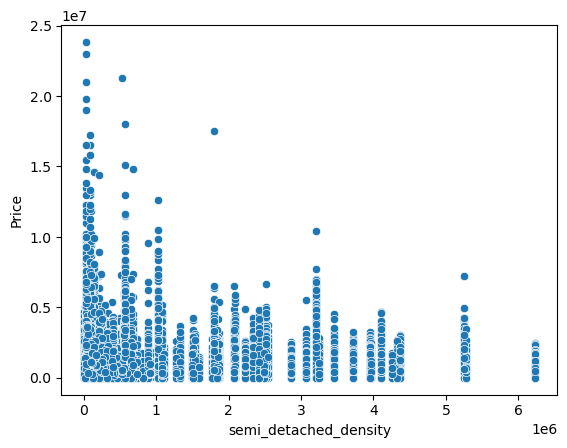

In [39]:
sns.scatterplot(data=house_prices_gpd,x='semi_detached_density',y='Price')

In [43]:
# Create a base map
from folium import Choropleth

plot_geography = neighbourhoods.to_crs(epsg=4326)[['neighbourhood', 'geometry']]
plot_data = house_prices_gpd[['neighbourhood', 'Size']]

map_6 = folium.Map(location=[43.6426, -79.3871], 
                   tiles='cartodbpositron',
                   zoom_start=10)

# Add a choropleth map to the base map
Choropleth(geo_data=plot_geography.__geo_interface__, 
           data=plot_data, 
           columns=['neighbourhood', 'Size'],
           key_on='feature.properties.neighbourhood', 
           fill_color='YlOrRd', 
           legend_name='Number Of Detached'
          ).add_to(map_6)

# Display the map
map_6

In [44]:
# Create a base map
from folium import Choropleth

plot_geography = neighbourhoods.to_crs(epsg=4326)[['neighbourhood', 'geometry']]
plot_data = house_prices_gpd[['neighbourhood', 'number_of_detached_in_neighbourhood']]

map_6 = folium.Map(location=[43.6426, -79.3871], 
                   tiles='cartodbpositron',
                   zoom_start=10)

# Add a choropleth map to the base map
Choropleth(geo_data=plot_geography.__geo_interface__, 
           data=plot_data, 
           columns=['neighbourhood', 'number_of_detached_in_neighbourhood'],
           key_on='feature.properties.neighbourhood', 
           fill_color='YlOrRd', 
           legend_name='Number Of Detached'
          ).add_to(map_6)

# Display the map
map_6

In [45]:

# Create a base map
from folium import Choropleth

plot_geography = neighbourhoods.to_crs(epsg=4326)[['neighbourhood', 'geometry']]
plot_data = house_prices_gpd[['neighbourhood', 'number_of_semi_detached_in_neighbourhood']]

map_6 = folium.Map(location=[43.6426, -79.3871], 
                   tiles='cartodbpositron',
                   zoom_start=10)

# Add a choropleth map to the base map
Choropleth(geo_data=plot_geography.__geo_interface__, 
           data=plot_data, 
           columns=['neighbourhood', 'number_of_semi_detached_in_neighbourhood'],
           key_on='feature.properties.neighbourhood', 
           fill_color='YlOrRd', 
           legend_name='Number Of Semi-Detached'
          ).add_to(map_6)

# Display the map
map_6

In [46]:

# Create a base map
from folium import Choropleth

plot_geography = neighbourhoods.to_crs(epsg=4326)[['neighbourhood', 'geometry']]
plot_data = house_prices_gpd[['neighbourhood', 'number_of_condos_in_neighbourhood']]

map_6 = folium.Map(location=[43.6426, -79.3871], 
                   tiles='cartodbpositron',
                   zoom_start=10)

# Add a choropleth map to the base map
Choropleth(geo_data=plot_geography.__geo_interface__, 
           data=plot_data, 
           columns=['neighbourhood', 'number_of_condos_in_neighbourhood'],
           key_on='feature.properties.neighbourhood', 
           fill_color='YlOrRd', 
           legend_name='Number Of Condos '
          ).add_to(map_6)

# Display the map
map_6

In [52]:
house_prices_gpd_clean = pd.read_csv('this_is_the_completed_csv!.csv')
# Create a geodataframe from the houses dataframe with longitude and latidue as geometry
house_prices_gpd_clean = gpd.GeoDataFrame(house_prices_gpd_clean, geometry = 
                                          gpd.points_from_xy(house_prices_gpd_clean['propertyLng'], house_prices_gpd_clean['propertyLat']))
house_prices_gpd_clean.crs = {'init': 'epsg:4326'}
house_prices_gpd_clean['log_adj_price']=np.log(house_prices_gpd_clean['Price'])

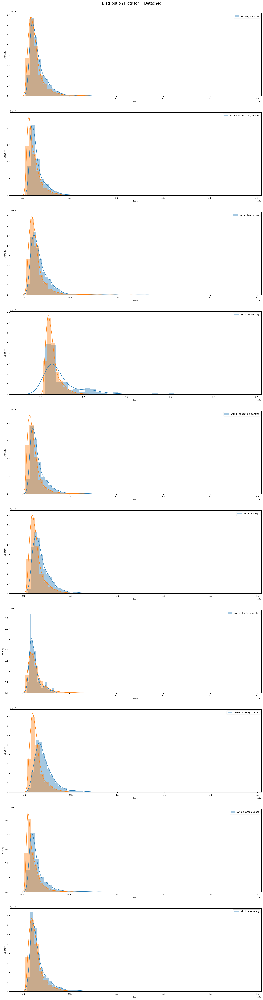

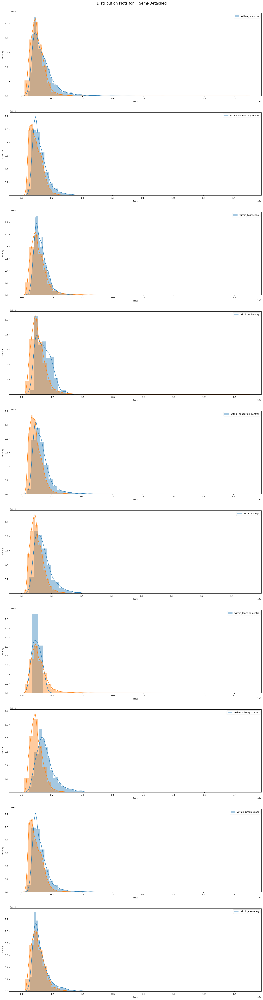

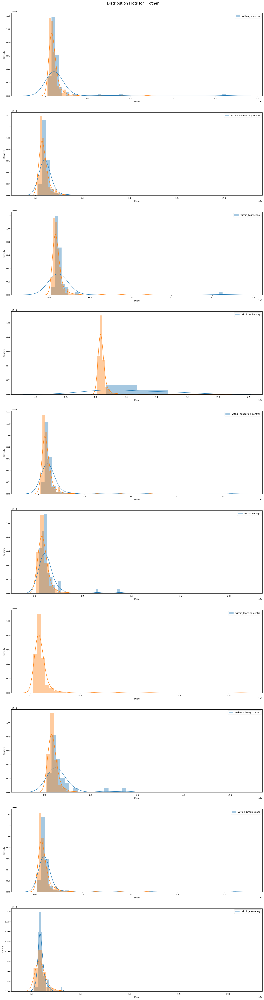

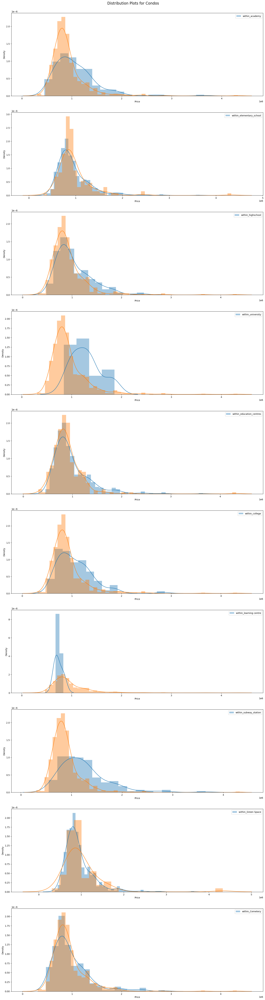

In [50]:
building_types = ['T_Detached', 'T_Semi-Detached', 'T_other']

for building in building_types:

    fig, (ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10)=plt.subplots(10,1,figsize=(20,70))
    plt.suptitle(f'Distribution Plots for {building}', fontsize=16)
    plt.subplots_adjust(top=0.97)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_academy']==1),'Price'],ax=ax1,label='within_academy')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_academy']==0),'Price'],ax=ax1)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_elementary school']==1),'Price'],ax=ax2,label='within_elementary_school')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_elementary school']==0),'Price'],ax=ax2)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_highschool']==1),'Price'],ax=ax3,label='within_highschool')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_highschool']==0),'Price'],ax=ax3)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_university']==1),'Price'],ax=ax4,label='within_university')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_university']==0),'Price'],ax=ax4)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_education_centres']==1),'Price'],ax=ax5,label='within_education_centres')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_education_centres']==0),'Price'],ax=ax5)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_college']==1),'Price'],ax=ax6,label='within_college')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_college']==0),'Price'],ax=ax6)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_learning centre']==1),'Price'],ax=ax7,label='within_learning centre')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_learning centre']==0),'Price'],ax=ax7)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_subway_station']==1),'Price'],ax=ax8,label='within_subway_station')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_subway_station']==0),'Price'],ax=ax8)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_green_space']==1),'Price'],ax=ax9,label='within_Green Space')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_green_space']==0),'Price'],ax=ax9)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_cemetery']==1),'Price'],ax=ax10,label='within_Cemetery')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_cemetery']==0),'Price'],ax=ax10)

    ax1.legend()
    ax2.legend()
    ax3.legend()
    ax4.legend()
    ax5.legend()
    ax6.legend()
    ax7.legend()
    ax8.legend()
    ax9.legend()
    ax10.legend()

    plt.show()

fig, (ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10)=plt.subplots(10,1,figsize=(20,70))

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_academy']==1),'Price'],ax=ax1,label='within_academy')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_academy']==0),'Price'],ax=ax1)

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_elementary school']==1),'Price'],ax=ax2,label='within_elementary_school')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_elementary school']==0),'Price'],ax=ax2)

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_highschool']==1),'Price'],ax=ax3,label='within_highschool')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_highschool']==0),'Price'],ax=ax3)

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_university']==1),'Price'],ax=ax4,label='within_university')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_university']==0),'Price'],ax=ax4)

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_education_centres']==1),'Price'],ax=ax5,label='within_education_centres')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_education_centres']==0),'Price'],ax=ax5)

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_college']==1),'Price'],ax=ax6,label='within_college')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_college']==0),'Price'],ax=ax6)

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_learning centre']==1),'Price'],ax=ax7,label='within_learning centre')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_learning centre']==0),'Price'],ax=ax7)

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_subway_station']==1),'Price'],ax=ax8,label='within_subway_station')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_subway_station']==0),'Price'],ax=ax8)

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_green_space']==1),'Price'],ax=ax9,label='within_Green Space')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_green_space']==0),'Price'],ax=ax9)

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_cemetery']==1),'Price'],ax=ax10,label='within_Cemetery')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_cemetery']==0),'Price'],ax=ax10)
	


ax1.legend()
ax2.legend()
ax3.legend()
ax4.legend()
ax5.legend()
ax6.legend()
ax7.legend()
ax8.legend()
ax9.legend()
ax10.legend()

plt.suptitle(f'Distribution Plots for Condos', fontsize=16)
plt.subplots_adjust(top=0.97)
plt.show()


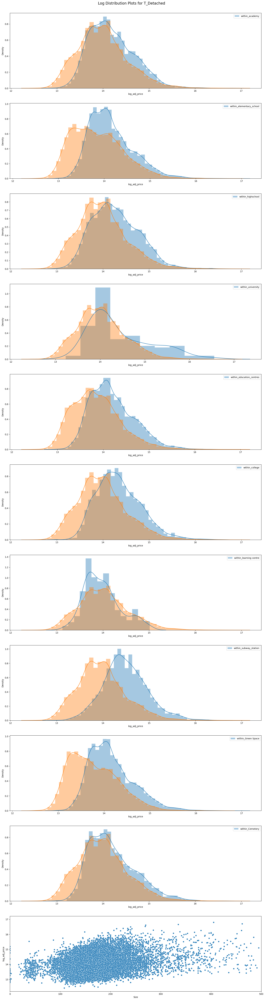

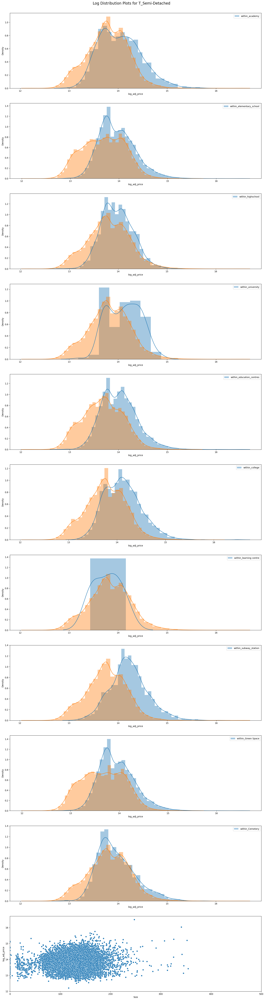

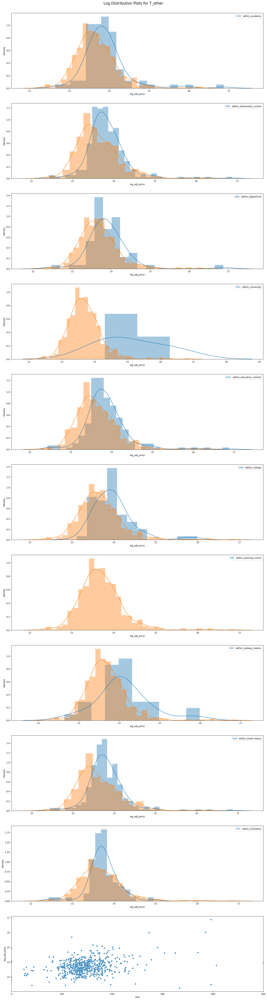

KeyError: 'T_condo'

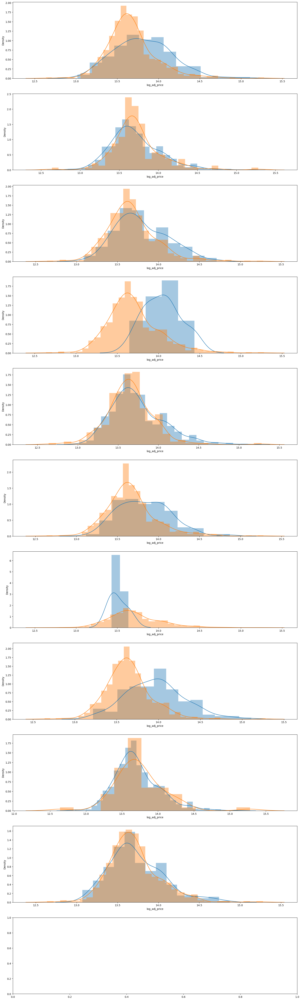

In [54]:
building_types = ['T_Detached', 'T_Semi-Detached', 'T_other']

for building in building_types:

    fig, (ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11)=plt.subplots(11,1,figsize=(20,70))
    plt.suptitle(f'Log Distribution Plots for {building}', fontsize=16)
    plt.subplots_adjust(top=0.97)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_academy']==1),'log_adj_price'],ax=ax1,label='within_academy')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_academy']==0),'log_adj_price'],ax=ax1)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_elementary school']==1),'log_adj_price'],ax=ax2,label='within_elementary_school')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_elementary school']==0),'log_adj_price'],ax=ax2)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_highschool']==1),'log_adj_price'],ax=ax3,label='within_highschool')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_highschool']==0),'log_adj_price'],ax=ax3)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_university']==1),'log_adj_price'],ax=ax4,label='within_university')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_university']==0),'log_adj_price'],ax=ax4)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_education_centres']==1),'log_adj_price'],ax=ax5,label='within_education_centres')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_education_centres']==0),'log_adj_price'],ax=ax5)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_college']==1),'log_adj_price'],ax=ax6,label='within_college')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_college']==0),'log_adj_price'],ax=ax6)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_learning centre']==1),'log_adj_price'],ax=ax7,label='within_learning centre')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_learning centre']==0),'log_adj_price'],ax=ax7)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_subway_station']==1),'log_adj_price'],ax=ax8,label='within_subway_station')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_subway_station']==0),'log_adj_price'],ax=ax8)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_green_space']==1),'log_adj_price'],ax=ax9,label='within_Green Space')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_green_space']==0),'log_adj_price'],ax=ax9)

    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_cemetery']==1),'log_adj_price'],ax=ax10,label='within_Cemetery')
    sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean[building]==1)&(house_prices_gpd_clean['within_cemetery']==0),'log_adj_price'],ax=ax10)

    sns.scatterplot(data=house_prices_gpd_clean[house_prices_gpd_clean[building]==1],x='Size',y='log_adj_price',ax=ax11)
    ax11.set_xlim(0, 500)
    

    ax1.legend()
    ax2.legend()
    ax3.legend()
    ax4.legend()
    ax5.legend()
    ax6.legend()
    ax7.legend()
    ax8.legend()
    ax9.legend()
    ax10.legend()

    plt.show()

fig, (ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11)=plt.subplots(11,1,figsize=(20,70))

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_academy']==1),'log_adj_price'],ax=ax1,label='within_academy')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_academy']==0),'log_adj_price'],ax=ax1)

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_elementary school']==1),'log_adj_price'],ax=ax2,label='within_elementary_school')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_elementary school']==0),'log_adj_price'],ax=ax2)

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_highschool']==1),'log_adj_price'],ax=ax3,label='within_highschool')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_highschool']==0),'log_adj_price'],ax=ax3)

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_university']==1),'log_adj_price'],ax=ax4,label='within_university')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_university']==0),'log_adj_price'],ax=ax4)

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_education_centres']==1),'log_adj_price'],ax=ax5,label='within_education_centres')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_education_centres']==0),'log_adj_price'],ax=ax5)

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_college']==1),'log_adj_price'],ax=ax6,label='within_college')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_college']==0),'log_adj_price'],ax=ax6)

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_learning centre']==1),'log_adj_price'],ax=ax7,label='within_learning centre')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_learning centre']==0),'log_adj_price'],ax=ax7)

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_subway_station']==1),'log_adj_price'],ax=ax8,label='within_subway_station')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_subway_station']==0),'log_adj_price'],ax=ax8)

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_green_space']==1),'log_adj_price'],ax=ax9,label='within_Green Space')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_green_space']==0),'log_adj_price'],ax=ax9)

sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_cemetery']==1),'log_adj_price'],ax=ax10,label='within_Cemetery')
sns.distplot(house_prices_gpd_clean.loc[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)&(house_prices_gpd_clean['within_cemetery']==0),'log_adj_price'],ax=ax10)

sns.scatterplot(data=house_prices_gpd_clean[house_prices_gpd_clean['T_condo']==1],x='Size',y='log_adj_price',ax=ax11)
ax11.set_xlim(0, 200)	


ax1.legend()
ax2.legend()
ax3.legend()
ax4.legend()
ax5.legend()
ax6.legend()
ax7.legend()
ax8.legend()
ax9.legend()
ax10.legend()

plt.suptitle(f'Log Distribution Plots for Condos', fontsize=16)
plt.subplots_adjust(top=0.97)
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

building_types = ['T_Detached', 'T_Semi-Detached', 'T_other']

for building in building_types:
    # Create a new figure and set of subplots for each building type
    fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(20, 10))
    
    # Scatter plots for each feature
    sns.scatterplot(data=house_prices_gpd_clean[house_prices_gpd_clean[building] == 1], x='#_of_academy_within', y='Price', ax=ax1)
    sns.scatterplot(data=house_prices_gpd_clean[house_prices_gpd_clean[building] == 1], x='#_of_subway_station_within', y='Price', ax=ax6)
    sns.scatterplot(data=house_prices_gpd_clean[house_prices_gpd_clean[building] == 1], x='#_of_university_within', y='Price', ax=ax2)
    sns.scatterplot(data=house_prices_gpd_clean[house_prices_gpd_clean[building] == 1], x='#_of_highschool_within', y='Price', ax=ax3)
    sns.scatterplot(data=house_prices_gpd_clean[house_prices_gpd_clean[building] == 1], x='#_of_elementary school_within', y='Price', ax=ax4)
    sns.scatterplot(data=house_prices_gpd_clean[house_prices_gpd_clean[building] == 1], x='#_of_green_space_within', y='Price', ax=ax5)

    # Set subplot title based on building type
    plt.suptitle(f'Scatter Plots for {building}', fontsize=16)

    # Show the plots
    plt.show()

fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(20, 10))
    
# Scatter plots for each feature
sns.scatterplot(data=house_prices_gpd_clean[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)], x='#_of_academy_within', y='Price', ax=ax1)
sns.scatterplot(data=house_prices_gpd_clean[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)], x='#_of_subway_station_within', y='Price', ax=ax6)
sns.scatterplot(data=house_prices_gpd_clean[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)], x='#_of_university_within', y='Price', ax=ax2)
sns.scatterplot(data=house_prices_gpd_clean[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)], x='#_of_highschool_within', y='Price', ax=ax3)
sns.scatterplot(data=house_prices_gpd_clean[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)], x='#_of_elementary school_within', y='Price', ax=ax4)
sns.scatterplot(data=house_prices_gpd_clean[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)], x='#_of_green_space_within', y='Price', ax=ax5)

# Set subplot title based on building type
plt.suptitle(f'Scatter Plots for condos', fontsize=16)

    # Show the plots
plt.show()


In [ ]:
building_types = ['T_Detached', 'T_Semi-Detached', 'T_condo']

fig, ((ax1,ax2,ax3),(ax4,ax5,ax6),(ax7,ax8,ax9))=plt.subplots(3,3,figsize=(30,10))

sns.boxplot(data=house_prices_gpd_clean[house_prices_gpd_clean['T_Detached']==1],x='within_subway_station',y='Price',ax=ax1,showfliers=False)
sns.boxplot(data=house_prices_gpd_clean[house_prices_gpd_clean['T_Semi-Detached']==1],x='within_subway_station',y='Price',ax=ax2,showfliers=False)
sns.boxplot(data=house_prices_gpd_clean[house_prices_gpd_clean['T_condo']==1],x='within_subway_station',y='Price',ax=ax3,showfliers=False)

sns.boxplot(data=house_prices_gpd_clean[house_prices_gpd_clean['T_Detached']==1],x='within_university',y='Price',ax=ax4,showfliers=False)
sns.boxplot(data=house_prices_gpd_clean[house_prices_gpd_clean['T_Semi-Detached']==1],x='within_university',y='Price',ax=ax5,showfliers=False)
sns.boxplot(data=house_prices_gpd_clean[house_prices_gpd_clean['T_condo']==1],x='within_university',y='Price',ax=ax6,showfliers=False)

sns.boxplot(data=house_prices_gpd_clean[house_prices_gpd_clean['T_Detached']==1],x='within_education_centres',y='Price',ax=ax7,showfliers=False)
sns.boxplot(data=house_prices_gpd_clean[house_prices_gpd_clean['T_Semi-Detached']==1],x='within_education_centres',y='Price',ax=ax8,showfliers=False)
sns.boxplot(data=house_prices_gpd_clean[house_prices_gpd_clean['T_condo']==1],x='within_education_centres',y='Price',ax=ax9,showfliers=False)



In [ ]:
building_types = ['T_Detached', 'T_Semi-Detached', 'T_other']

for building in building_types:
    fig, (ax1)=plt.subplots(1,1,figsize=(30,15))
    sns.scatterplot(data=house_prices_gpd_clean[house_prices_gpd_clean[building]==1],x='Neighb_pop',y='Adjusted_Price',ax=ax1)
    plt.suptitle(f'Scatter Plots for {building}', fontsize=16)

sns.scatterplot(data=house_prices_gpd_clean[(house_prices_gpd_clean['T_Detached']==0)&(house_prices_gpd_clean['T_Semi-Detached']==0)&(house_prices_gpd_clean['T_other']==0)], x='Neighb_pop', y='Adjusted_Price')
plt.suptitle(f'Scatter Plots for Condos', fontsize=16)
